# Project 2
- 목표 : 데이터셋을 사용하여 머신러닝 모델을 만든 후 성능 및 인사이트를 도출/공유하기


계획
- Day 1 데이터 선정, 스토리텔링, 전처리 약간+모델링 => 성능 체크 
- Day 2 전처리 추가작업, 특성 추가하기, 성능 향상
- Day 3 발표자료 작성, 스크립트 작성
- Day 4 녹화 및 제출

## 프로젝트 시나리오

세계의 자연재해를 연구하는 기관에서 쓰나미 데이터 분석 프로젝트를 실시하였다. 주제는 **현재까지 발생한 쓰나미 데이터를 분석**하여 쓰나미에 대해 **대피 기준을 제시**하고 **피해를 최소화** 하는 것이다.

### 1) 데이터 선정 이유 및 문제 정의 
- 자연재해는 언제 발생할 지 알 수 없기 때문에 발생 시 긴박한 대응이 요구된다. 따라서 **사전에 대응 할 수 있도록 시나리오를 준비**하는 것이 필요하며 이 때 **데이터에 근거한 분석자료로 합리적인 대비책을 마련**하는 것이 중요하다.
- 수차례에 걸친 피해로 인해 이미 쓰나미 측정 장비를 갖춘 국가들도 있지만, 이러한 **첨단 장비를 갖추지 못한 지역**에서 쓰나미가 발생할 수 있다. 이러한 때에 **피해를 최소화하기 위해 데이터분석을 통한 대피 기준을 제시**하고자 하였다.

#### 문제 정의
- 쓰나미 발생 시 물이 잠기지 않을 높은 곳으로 대피할 수 있도록 **Maximum Water Height (m)**를 추정한다.
- **회귀** 유형의 문제가 될 것이다.




### 2) 데이터를 이용한 가설 및 평가지표, 베이스라인 선택
- 이번 프로젝트에서는 쓰나미 발생 시 피해 범위를 예측하여 최소한의 대피 기준을 파악해본다.
- **가설** : 갑작스런 지진 발생으로 쓰나미 우려가 있을 시, 해안가 주민들에게 대피령을 내린다. 이 때 쓰나미를 유발한 지진의 규모와 발생 거리 등을 고려하여 최소 몇미터 이상의 높이로 대피할 것을 권한다. 이로써 피해를 줄이고 안전을 도모한다.

- **타겟선정이유** : 쓰나미 발생 시 피해를 줄이기 위해서는 반드시 높은 곳으로 이동해야 한다. 멀리 가는 것도 중요하다고 생각할 수 있으나, 해안으로 밀려들어오는 물의 속도가 매우 빠르기 때문에 피하기 쉽지 않다. 또한 지형에 따라 고도차이가 크지 않으면 멀리 이동해도 피해를 입을 수 있다. 따라서 쓰나미로 밀려들어오는 물의 높이를 감안하여 얼마나 높은 곳으로 대피해야할지를 타겟으로 선정했다.


- 평가지표 : 회귀 문제의 평가지표는 R-squared나 MAE를 사용하는데, 이번 프로젝트에서는 **오차가 얼마나 되는지를 미터(m) 단위로 체감**하는데 더 유리한 **MAE**를 기준으로 평가해보겠다.


- 베이스라인 : 회귀문제의 베이스라인은 **타겟의 평균값**으로 한다.


- 전처리를 먼저 해주고, 4)에서 모델링 하기 전에 베이스라인을 비교하겠다.


### 자료 출처
- noaa.org(National Oceanic and Atmospheric Administration, 미국 국립해양대기국)의 최신 쓰나미 데이터를 분석할 것이다. 이 데이터에는 기원전 2000년부터 현재까지의 전 세계 쓰나미 기록이 담겨 있다.
- 데이터 출처 : https://www.ngdc.noaa.gov/hazard/tsunami-db-intro.html
- National Geophysical Data Center / World Data Service: NCEI/WDS Global Historical Tsunami Database. NOAA National Centers for Environmental Information. doi:10.7289/V5PN93H7

#### 용어 정의
- 쓰나미 : 심해 해저에서 생겨난 에너지의 영향으로 발생한 지진 해일
- **쓰나미 런업** : 쓰나미가 해안에 도달하여 거대한 파도처럼 물이 밀려들어옴


- 따라서, 한 번의 쓰나미 발생으로 여러 지역에 쓰나미 런업이 발생할 수 있다. 
- 이번 데이터 분석에서는 각 런업의 높이를 측정한 데이터를 사용할 것이다.

In [ ]:
!pip install category_encoders==2.*
!pip3 install pdpbox
!pip3 install shap

In [ ]:
# 한글 깨짐 수정
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree       
Reading state information... Done
fonts-nanum is already the newest version (20170925-1).
0 upgraded, 0 newly installed, 0 to remove and 11 not upgraded.
/usr/share/fonts: caching, new cache contents: 0 fonts, 1 dirs
/usr/share/fonts/truetype: caching, new cache contents: 0 fonts, 3 dirs
/usr/share/fonts/truetype/humor-sans: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/truetype/liberation: caching, new cache contents: 16 fonts, 0 dirs
/usr/share/fonts/truetype/nanum: caching, new cache contents: 10 fonts, 0 dirs
/usr/local/share/fonts: caching, new cache contents: 0 fonts, 0 dirs
/root/.local/share/fonts: skipping, no such directory
/root/.fonts: skipping, no such directory
/var/cache/fontconfig: cleaning cache directory
/root/.cache/fontconfig: not cleaning non-existent cache directory
/root/.fontconfig: not cleaning non-existent cache directory
fc-cache: succeeded


In [ ]:
# 폰트 설정
import matplotlib as mpl
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
%config InlineBackend.figure_format='retina'

mpl.rc("font", family='NanumBarunGothic')
plt.rc("font", family='NanumBarunGothic')
# 마이너스 사인 수정
mpl.rc('axes', unicode_minus=False)

#### 데이터 불러오기
- runups 데이터는 쓰나미 발생 시 물이 넘쳤을 때마다의 데이터를 나타내고 있다.
- tsunamis 데이터는 해당 쓰나미에 대한 요약 정보를 담고 있다.
- 따라서, runups 데이터를 기반으로 하고 필요한 정보가 있으면 tsunamis 에서 가져오기로 한다.

In [ ]:
import pandas as pd

runups = pd.read_csv('runups.csv')
tsunamis = pd.read_csv('tsunamis_noaa.csv')

In [ ]:
runups.shape, tsunamis.shape

((28447, 44), (2704, 45))

In [ ]:
runups.head()

,Year,Mo,Dy,Hr,Mn,Sec,Tsunami Event Validity,Tsunami Cause Code,Tsu Src,Earthquake Magnitude,Vol,More Info,Doubtful Runup,Country,Area,Location Name,Latitude,Longitude,Distance From Source (km),Initial Wave Arrival Day,Initial Wave Arrival Hour,Initial Wave Arrival Minute,Travel Hours,Travel Minutes,Max Wave Arrival Day,Max Wave Arrival Hour,Max Wave Arrival Minute,Maximum Water Height (m),Max Inundation Distance (m),Measurement Type,Period,First Motion,Deaths,Death Description,Missing,Missing Description,Injuries,Injuries Description,Damage $Mil,Damage Description,Houses Destroyed,Houses Destroyed Description,Houses Damaged,Houses Damaged Description
0,-2000,NaN,NaN,NaN,NaN,NaN,1,1,1,NaN,NaN,NaN,n,SYRIA,NaN,UGARIT,35.583,35.750,11.984,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN
1,-1610,NaN,NaN,NaN,NaN,NaN,4,6,3,NaN,1351.0,NaN,n,GREECE,NaN,N. AND E. COAST CRETE,35.500,25.000,106.183,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN
2,-1610,NaN,NaN,NaN,NaN,NaN,4,6,3,NaN,1351.0,NaN,n,SYRIA,NaN,UGARIT,35.583,35.750,937.229,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN
3,-479,NaN,NaN,NaN,NaN,NaN,2,1,9,7.0,NaN,NaN,n,GREECE,NaN,POTIDAEA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-426,6.0,NaN,NaN,NaN,NaN,4,1,10,7.1,NaN,NaN,n,GREECE,NaN,ATALANTI ISLAND,38.675,23.096,42.517,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN


In [ ]:
tsunamis.head()

,Year,Mo,Dy,Hr,Mn,Sec,Tsunami Event Validity,Tsunami Cause Code,Earthquake Magnitude,Vol,More Info,Deposits,Country,Location Name,Latitude,Longitude,Maximum Water Height (m),Number of Runups,Tsunami Magnitude (Abe),Tsunami Magnitude (Iida),Tsunami Intensity,Deaths,Death Description,Missing,Missing Description,Injuries,Injuries Description,Damage ($Mil),Damage Description,Houses Destroyed,Houses Destroyed Description,Houses Damaged,Houses Damaged Description,Total Deaths,Total Death Description,Total Missing,Total Missing Description,Total Injuries,Total Injuries Description,Total Damage ($Mil),Total Damage Description,Total Houses Destroyed,Total Houses Destroyed Description,Total Houses Damaged,Total Houses Damaged Description
0,-2000,NaN,NaN,NaN,NaN,NaN,1,1.0,NaN,NaN,NaN,0,SYRIA,SYRIAN COASTS,35.683,35.80,NaN,1,NaN,NaN,6.0,NaN,3.0,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,4.0,NaN,NaN,NaN,NaN
1,-1610,NaN,NaN,NaN,NaN,NaN,4,6.0,NaN,1351.0,NaN,24,GREECE,THERA ISLAND (SANTORINI),36.400,25.40,90.0,2,NaN,NaN,6.0,NaN,3.0,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN
2,-1365,NaN,NaN,NaN,NaN,NaN,1,1.0,NaN,NaN,NaN,0,SYRIA,SYRIAN COASTS,35.683,35.80,NaN,0,NaN,NaN,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN
3,-1300,NaN,NaN,NaN,NaN,NaN,2,0.0,6.0,NaN,NaN,0,TURKEY,"IONIAN COASTS, TROAD",39.960,26.24,NaN,0,NaN,NaN,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-760,NaN,NaN,NaN,NaN,NaN,2,0.0,NaN,NaN,NaN,0,ISRAEL,ISRAEL AND LEBANON COASTS,NaN,NaN,NaN,0,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### 3) EDA와 데이터 전처리

#### 결측치 처리, 특성 정리
- 특성이 40개 이상으로 많은데, 결측치가 90% 이상인 열은 drop 해주고 정리를 거친 후에 각 특성에 대해 설명하겠다.
- 날짜 데이터는 남기고 시,분,초 데이터는 지워주었다.

In [ ]:
df = runups.copy()

In [ ]:
features = df.keys()

for feature in features:

  if df[feature].isna().sum() >= len(df)*0.90:
    df.drop(feature, axis=1, inplace=True)

  else:
    continue

dd = df.loc[:,'Hr':'Sec']
df.drop(dd, axis=1, inplace=True)
df

,Year,Mo,Dy,Tsunami Event Validity,Tsunami Cause Code,Tsu Src,Earthquake Magnitude,Doubtful Runup,Country,Area,Location Name,Latitude,Longitude,Distance From Source (km),Maximum Water Height (m),Measurement Type
0,-2000,NaN,NaN,1,1,1,NaN,n,SYRIA,NaN,UGARIT,35.583,35.750,11.984,NaN,1.0
1,-1610,NaN,NaN,4,6,3,NaN,n,GREECE,NaN,N. AND E. COAST CRETE,35.500,25.000,106.183,NaN,1.0
2,-1610,NaN,NaN,4,6,3,NaN,n,SYRIA,NaN,UGARIT,35.583,35.750,937.229,NaN,1.0
3,-479,NaN,NaN,2,1,9,7.0,n,GREECE,NaN,POTIDAEA,NaN,NaN,NaN,NaN,NaN
4,-426,6.0,NaN,4,1,10,7.1,n,GREECE,NaN,ATALANTI ISLAND,38.675,23.096,42.517,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28442,2021,2.0,10.0,4,1,5763,7.7,n,SAMOA,NaN,APIA,NaN,NaN,NaN,NaN,NaN
28443,2021,2.0,10.0,4,1,5763,7.7,n,VANUATU,NaN,PORT VILA,NaN,NaN,NaN,NaN,NaN
28444,2021,2.0,10.0,4,1,5763,7.7,n,NEW ZEALAND,NaN,AHIPARA,-35.170,173.160,1351.420,NaN,1.0
28445,2021,2.0,10.0,4,1,5763,7.7,n,NEW ZEALAND,NaN,D5401000 BPR,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.isna().sum()

Year                             0
Mo                             104
Dy                             219
Tsunami Event Validity           0
Tsunami Cause Code               0
Tsu Src                          0
Earthquake Magnitude          2024
Doubtful Runup                   0
Country                          2
Area                          5953
Location Name                  209
Latitude                     14722
Longitude                    14722
Distance From Source (km)    14850
Maximum Water Height (m)     16941
Measurement Type             14358
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28447 entries, 0 to 28446
Data columns (total 16 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Year                       28447 non-null  int64  
 1   Mo                         28343 non-null  float64
 2   Dy                         28228 non-null  float64
 3   Tsunami Event Validity     28447 non-null  int64  
 4   Tsunami Cause Code         28447 non-null  int64  
 5   Tsu Src                    28447 non-null  int64  
 6   Earthquake Magnitude       26423 non-null  float64
 7   Doubtful Runup             28447 non-null  object 
 8   Country                    28445 non-null  object 
 9   Area                       22494 non-null  object 
 10  Location Name              28238 non-null  object 
 11  Latitude                   13725 non-null  float64
 12  Longitude                  13725 non-null  float64
 13  Distance From Source (km)  13597 non-null  flo

특성 소개
  - Year : 쓰나미 발생 연도
  - Mo : 월
  - Dy : 일
  - Tsunami Event Validity : 쓰나미 이벤트 유효성
    - -1 : 잘못된 입력
    - 0 : 내륙 강에서 약한 쓰나미
    - 1 : 매우 의심스러운 쓰나미
    - 2 : 의심스러운 쓰나미
    - 3 : 쓰나미로 예상됨
    - 4 : 확실한 쓰나미
  - Tsunami Cause Code : 쓰나미 원인 코드
    - 0 : 알 수 없음
    - 1 : 지진
    - 2 : 의심스러운 지진
    - 3 : 지진과 산사태
    - 4 : 화산과 지진
    - 5 : 화산, 지진, 산사태
    - 6 : 화산
    - 7 : 화산 및 산사태
    - 8 : 산사태
    - 9 : 기상
    - 10 : 폭발
    - 11 : 천문 조수
  - Tsu Src : 쓰나미 고유 코드
  - Earthquake Magnitude : 지진 규모
  - Doubtful Runup : 쓰나미 런업에 대한 의심정도(쓰나미로 인한 런업이 맞는지)
    - n : 의심할만한 부분 없음
    - y : 의심스러움
    - m : 기상 원인에 의한 해일로 추정
  - Country : 국가
  - Area : 지역 이름
  - Location Name : 지역 이름(상세)
  - Latitude : 위도 
  - Longitude : 경도
  - Distance From Source (km) : 지진 발생 위치와 쓰나미 런업 거리 (km)
  - Maximum Water Height (m) : 최대 수위(m)
  - Measurement Type : 수위 측정 방법
    - 1 : 목격자가 눈으로 관찰한 최대수위
    - 2 : 조수 게이지(진폭)
    - 3 : 심해 게이지
    - 4 : 물 높이(쓰나미 후 조사 측정)
    - 5 : 런업 높이(쓰나미 후 조사 측정)
    - 6 : 대기파(기상학적 또는 대기 장애에 의한 파동 측정)
    - 7 : 정상파
    - 8 : 항구의 수위 높이
    - 9 : 스플래시 마크(쓰나미 후 측정)
    - 10 : 수심



날짜(월,일)가 없는 경우 1로 채워준다. 

In [ ]:
df[['Mo','Dy']] = df[['Mo','Dy']].fillna(1).astype(int)

In [ ]:
df.head()

,Year,Mo,Dy,Tsunami Event Validity,Tsunami Cause Code,Tsu Src,Earthquake Magnitude,Doubtful Runup,Country,Area,Location Name,Latitude,Longitude,Distance From Source (km),Maximum Water Height (m),Measurement Type
0,-2000,1,1,1,1,1,NaN,n,SYRIA,NaN,UGARIT,35.583,35.750,11.984,NaN,1.0
1,-1610,1,1,4,6,3,NaN,n,GREECE,NaN,N. AND E. COAST CRETE,35.500,25.000,106.183,NaN,1.0
2,-1610,1,1,4,6,3,NaN,n,SYRIA,NaN,UGARIT,35.583,35.750,937.229,NaN,1.0
3,-479,1,1,2,1,9,7.0,n,GREECE,NaN,POTIDAEA,NaN,NaN,NaN,NaN,NaN
4,-426,6,1,4,1,10,7.1,n,GREECE,NaN,ATALANTI ISLAND,38.675,23.096,42.517,NaN,1.0


In [ ]:
df.dtypes

Year                           int64
Mo                             int64
Dy                             int64
Tsunami Event Validity         int64
Tsunami Cause Code             int64
Tsu Src                        int64
Earthquake Magnitude         float64
Doubtful Runup                object
Country                       object
Area                          object
Location Name                 object
Latitude                     float64
Longitude                    float64
Distance From Source (km)    float64
Maximum Water Height (m)     float64
Measurement Type             float64
dtype: object

In [ ]:
df.isna().sum()

Year                             0
Mo                               0
Dy                               0
Tsunami Event Validity           0
Tsunami Cause Code               0
Tsu Src                          0
Earthquake Magnitude          2024
Doubtful Runup                   0
Country                          2
Area                          5953
Location Name                  209
Latitude                     14722
Longitude                    14722
Distance From Source (km)    14850
Maximum Water Height (m)     16941
Measurement Type             14358
dtype: int64

타겟으로 선정한 Maximum Water Height (m) 가 없는 데이터는 제외한다.

In [ ]:
df.drop(df[df['Maximum Water Height (m)'].isna()].index, inplace=True)

Area는 지명인데, Location Name이 좀 더 상세화된 지명을 담고 있으므로 결측치가 많은 Area 특성을 지워준다.

In [ ]:
df.drop('Area', axis=1, inplace=True)

In [ ]:
df.isna().sum()

Year                           0
Mo                             0
Dy                             0
Tsunami Event Validity         0
Tsunami Cause Code             0
Tsu Src                        0
Earthquake Magnitude         619
Doubtful Runup                 0
Country                        0
Location Name                  3
Latitude                     276
Longitude                    276
Distance From Source (km)    304
Maximum Water Height (m)       0
Measurement Type             144
dtype: int64

그 외 지진강도, 위경도, 지진 발생위치와의 거리 등 데이터가 없는 행을 지워준다. 

In [ ]:
df.drop(df[df['Latitude'].isna()].index, inplace=True)
df.drop(df[df['Earthquake Magnitude'].isna()].index, inplace=True)
df.drop(df[df['Distance From Source (km)'].isna()].index, inplace=True)
df.drop(df[df['Location Name'].isna()].index, inplace=True)

In [ ]:
df.isna().sum()

Year                           0
Mo                             0
Dy                             0
Tsunami Event Validity         0
Tsunami Cause Code             0
Tsu Src                        0
Earthquake Magnitude           0
Doubtful Runup                 0
Country                        0
Location Name                  0
Latitude                       0
Longitude                      0
Distance From Source (km)      0
Maximum Water Height (m)       0
Measurement Type             112
dtype: int64

런업측정 방법(Measurement Type)의 결측치는 최빈값으로 채워준다.

In [ ]:
df['Measurement Type'].value_counts()

2.0     4228
1.0     2900
5.0     2148
4.0      940
10.0     237
7.0       40
0.0        7
9.0        6
3.0        5
8.0        2
Name: Measurement Type, dtype: int64

In [ ]:
df.loc[df['Measurement Type'].isna(), 'Measurement Type'] = 2.0

In [ ]:
df.isna().sum()

Year                         0
Mo                           0
Dy                           0
Tsunami Event Validity       0
Tsunami Cause Code           0
Tsu Src                      0
Earthquake Magnitude         0
Doubtful Runup               0
Country                      0
Location Name                0
Latitude                     0
Longitude                    0
Distance From Source (km)    0
Maximum Water Height (m)     0
Measurement Type             0
dtype: int64

결측치는 아니지만 제외할 데이터
- 쓰나미 런업이 맞는지 의심스럽거나 기상변화에 의한 원인으로 추측되는 경우는 이번 분석에서 제외한다.

In [ ]:
df['Doubtful Runup'].value_counts()

n    10608
y       16
m        1
Name: Doubtful Runup, dtype: int64

In [ ]:
df.drop(df[df['Doubtful Runup'].isin(['y','m'])].index, inplace=True)

- 모두 같은 값으로 통일되었으므로 해당 특성은 지워준다.

In [ ]:
df.drop('Doubtful Runup', axis=1, inplace=True)

In [ ]:
df

,Year,Mo,Dy,Tsunami Event Validity,Tsunami Cause Code,Tsu Src,Earthquake Magnitude,Country,Location Name,Latitude,Longitude,Distance From Source (km),Maximum Water Height (m),Measurement Type
74,684,11,29,4,1,53,8.4,JAPAN,ATASHIKA,33.91700,136.15000,254.701,3.00,1.0
103,887,8,2,3,1,76,6.5,JAPAN,S. COAST NIIGATA PREFECTURE,37.92000,139.05000,95.865,4.00,1.0
107,922,1,1,4,1,79,7.0,JAPAN,KUMAMONADA,33.80000,136.70000,0.000,2.00,1.0
111,1026,6,16,3,1,83,7.5,JAPAN,SUSA,34.61670,131.60000,27.371,10.00,1.0
112,1026,6,16,3,1,83,7.5,JAPAN,IWAMI COAST,34.88000,132.43000,58.303,10.00,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28436,2021,2,10,4,1,5763,7.7,AUSTRALIA,EDEN (TWOFOLD BAY),-37.07366,149.90774,2594.927,0.07,2.0
28437,2021,2,10,4,1,5763,7.7,TUVALU,FONGAFALE,-8.50200,179.19500,1803.015,0.05,2.0
28438,2021,2,10,4,1,5763,7.7,NEW ZEALAND,EAST CAPE,-37.55000,178.15900,1725.133,0.20,2.0
28440,2021,2,10,4,1,5763,7.7,NEW CALEDONIA,MARE ISLAND,-21.54800,167.87700,418.378,0.13,2.0


In [ ]:
df.keys()

Index(['Year', 'Mo', 'Dy', 'Tsunami Event Validity', 'Tsunami Cause Code',
       'Tsu Src', 'Earthquake Magnitude', 'Country', 'Location Name',
       'Latitude', 'Longitude', 'Distance From Source (km)',
       'Maximum Water Height (m)', 'Measurement Type'],
      dtype='object')

특성 추가
- 발생한 쓰나미에 대해 runup 횟수를 카운트한 데이터셋을 만들고,
기존 데이터셋에 합병하여 새로운 특성을 추가하였다.

In [ ]:
df_runups = pd.DataFrame(df.groupby('Tsu Src').agg('count').reset_index().iloc[:,:2])
df_runups.columns = ['Tsu_eventNo','Number_of_runups']
df_runups

,Tsu_eventNo,Number_of_runups
0,53,1
1,76,1
2,79,1
3,83,2
4,93,1
...,...,...
607,5752,1
608,5757,12
609,5760,1
610,5762,1


In [ ]:
df = df.merge(df_runups, how='left', left_on= 'Tsu Src', right_on = 'Tsu_eventNo')

In [ ]:
# merge하면서 중복된 열 삭제
df.drop('Tsu Src', axis=1, inplace=True)

- Date 특성을 추가하여 Year-Month-Day의 형식으로 나타낸다.

In [ ]:
df['Date'] = df[['Year','Mo','Dy']].astype(str).agg('-'.join, axis=1)
df['Date']

0        684-11-29
1          887-8-2
2          922-1-1
3        1026-6-16
4        1026-6-16
           ...    
10603    2021-2-10
10604    2021-2-10
10605    2021-2-10
10606    2021-2-10
10607    2021-2-10
Name: Date, Length: 10608, dtype: object

#### 카디널리티 및 중복 확인

In [ ]:
!pip3 install -U pandas-profiling

Requirement already up-to-date: pandas-profiling in /usr/local/lib/python3.7/dist-packages (2.11.0)


In [ ]:
import pandas_profiling
df.profile_report()

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

- 프로파일 리포트를 통해 살펴본 결과, 일부 중복 데이터가 남아있으므로 삭제해 준다.
- 높은 카디널리티를 갖는 국가, 지역명, 날짜 특성이 존재하는데 해당 특성들은 분석에 유의미하게 사용될 수 있으므로 삭제하지 않고 진행한다.
- 대신, 카디널리티가 높은 특성이 존재하므로 Ordinal Encoding을 사용하도록 한다. (OneHotEncoder 사용 시 특성수가 너무 높아져 차원의 저주에 빠질 위험성 있음)

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.shape

(10547, 16)

#### 이상치 확인

- 쓰나미 런업 최고수위 중 99%를 초과하는 값을 제외하고, 남은 값들 중의 최대값으로 대체한다.

예상되는 모델의 한계점 및 유용성
- 각각의 쓰나미 결과를 찾아보면 아주 높은 쓰나미 파도가 있었던 것은 사실이지만 대부분의 일반적인 쓰나미를 조금 더 잘 예측하기 위해서 이상치로 보고 대체해주었다.
- 현실적으로 지진 발생 시 쓰나미 우려가 있고 그 런업의 높이가 15m 이상일 것이라고 예측된다면, 규모와 에너지가 매우 거대한 쓰나미이기 때문에 모델에서 예측한 높이가 잘 맞지 않을 가능성이 있다. 따라서 예측값과 별개로 최대한 멀고 높은 곳으로 이동해야 할 것이다.

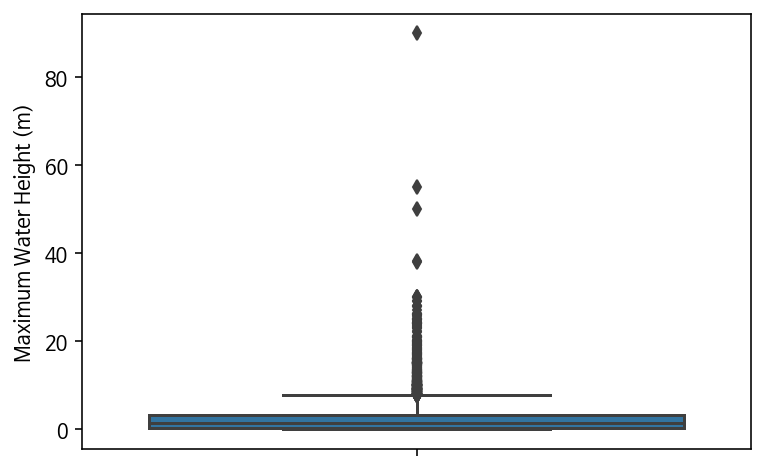

In [ ]:
import seaborn as sns
sns.boxplot(y = 'Maximum Water Height (m)', data=df);

In [ ]:
import numpy as np
df['Maximum Water Height (m)'] = df[df['Maximum Water Height (m)'] <= np.percentile(df['Maximum Water Height (m)'], 99)]['Maximum Water Height (m)']

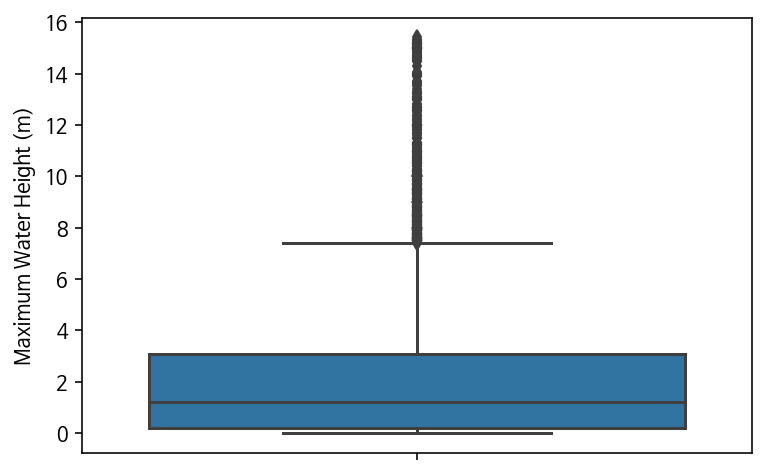

In [ ]:
import seaborn as sns
sns.boxplot(y = 'Maximum Water Height (m)', data=df);

In [ ]:
df['Maximum Water Height (m)'].max()

15.41

In [ ]:
df.loc[df['Maximum Water Height (m)'].isna(), 'Maximum Water Height (m)'] = 15.3

In [ ]:
df.isna().sum()

Year                         0
Mo                           0
Dy                           0
Tsunami Event Validity       0
Tsunami Cause Code           0
Earthquake Magnitude         0
Country                      0
Location Name                0
Latitude                     0
Longitude                    0
Distance From Source (km)    0
Maximum Water Height (m)     0
Measurement Type             0
Tsu_eventNo                  0
Number_of_runups             0
Date                         0
dtype: int64

지진 규모 분포
- 쓰나미를 일으킨 지진은 규모가 큰 편이어서 6 이상이 많다. 최대 9.5 정도로 이상치는 없는 것으로 보인다.

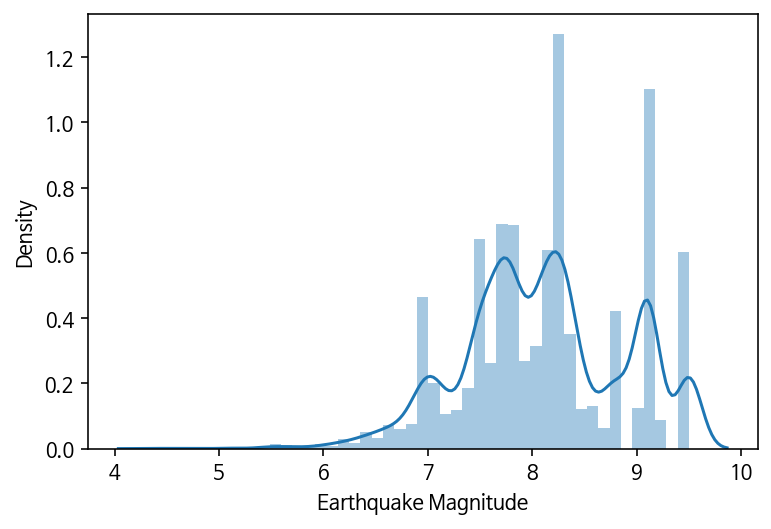

In [ ]:
sns.distplot(df['Earthquake Magnitude']);

#### 시각화

쓰나미 런업 위치를 지도에 시각화하기
- 지도를 확대하면 좀 더 세부적인 위치를 확인할 수 있다. 
- 위경도 데이터를 통해 지도상에 표시하였으며, 구역 내 런업횟수가 표현되었다.
- 쓰나미가 잦은 지역은 붉은 색 원으로 나타나 있다.

In [ ]:
import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster

In [ ]:
# Create a map
m_1 = folium.Map(location=[36.5,128], tiles='openstreetmap', zoom_start=3, )

In [ ]:
# Add points to the map
import math
mc = MarkerCluster()
for idx, row in df.iterrows():
    if not math.isnan(row['Longitude']) and not math.isnan(row['Latitude']):
        mc.add_child(Marker([row['Latitude'], row['Longitude']]))
m_1.add_child(mc)


국가별 쓰나미 런업 발생 횟수 Top 10

In [ ]:
df_cc = pd.DataFrame(df.groupby('Country').count().iloc[:,0]).reset_index()
df_cc.columns = ['Country','Tsunami Count']
df_cc = df_cc.sort_values(by='Tsunami Count', ascending=False).head(10)
df_cc

,Country,Tsunami Count
43,JAPAN,5431
14,CHILE,1103
38,INDONESIA,857
57,NEW ZEALAND,337
67,PERU,251
51,MEXICO,219
96,USA TERRITORY,150
83,SRI LANKA,142
31,GREECE,133
37,INDIA,131


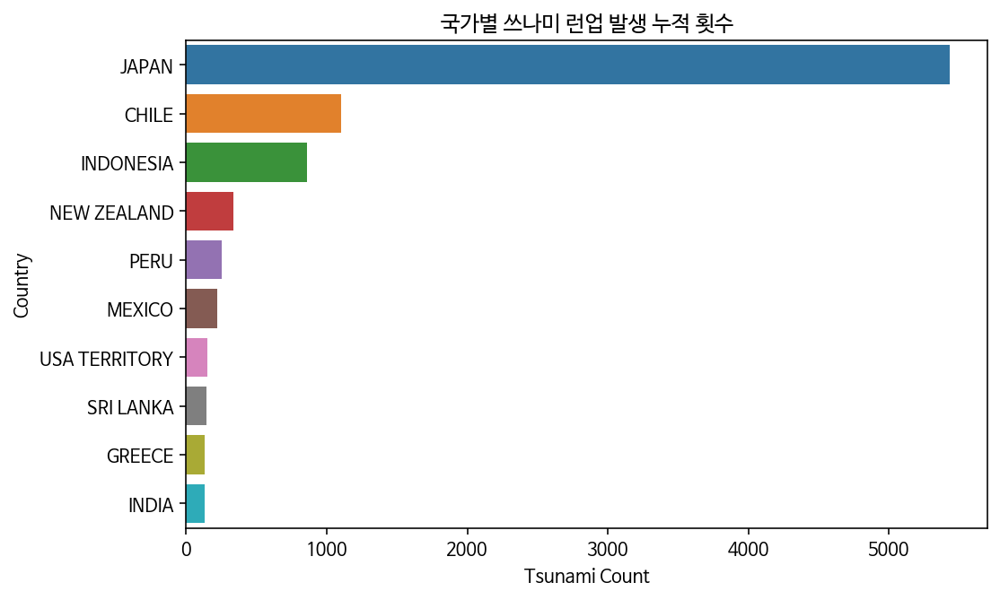

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(8,5))
sns.barplot(y='Country', x='Tsunami Count', data=df_cc)
plt.title('국가별 쓰나미 런업 발생 누적 횟수');

- 일본이 가장 쓰나미 발생 횟수가 많았다. 일본은 4개의 지각판(유라시아판, 북미판, 태평양판, 필리핀판)이 만나고 있는 지역으로 지진이 잦고 쓰나미 발생 횟수도 압도적으로 많다.
- 10위 안에 있는 국가들을 보면 칠레 인도네시아 뉴질랜드 페루 멕시코 등 불의고리라 부르는 환태평양 조산대에 위치한 국가들이 많다.
- 8위의 스리랑카는 환태평양 조산대에 위치해 있지는 않으나, 지난 2004년 발생한 인도양 지진해일로 많은 피해를 입었다.
- 9위의 그리스는 알프스 히말라야 조산대에 위치해있다.
- 지도를 통해 조사해보니, 인도네시아는 환태평양 조산대와 알프스 히말라야 조산대가 만나는 부분에 위치하여 지진 발생이 잦아 쓰나미 횟수가 많은 것으로 보인다.

연도별 쓰나미 발생 현황
- 예전 데이터들은 기록이 남아있지 않거나 측정이 불가능한 경우가 많았으므로 최근에 쓰나미가 자주 발생한 것처럼 보일 수 있다. (noaa 에서도 이 부분을 주의하라고 알리고 있다.)
- 따라서 최근 20년간의 쓰나미 런업 발생 횟수만을 살펴보려고 한다.

In [ ]:
df_y = pd.DataFrame(df.fillna(0).groupby('Year').agg('count').iloc[:,1]).reset_index()
df_y.columns = ['Year','Tsunami Count']
df_y = df_y[ (df_y['Year'] >= 2000) ]
df_y

,Year,Tsunami Count
169,2000,10
170,2001,98
171,2002,80
172,2003,247
173,2004,761
174,2005,30
175,2006,222
176,2007,159
177,2008,7
178,2009,112


In [ ]:
m = df_y['Tsunami Count'].mean()
m

191.9090909090909

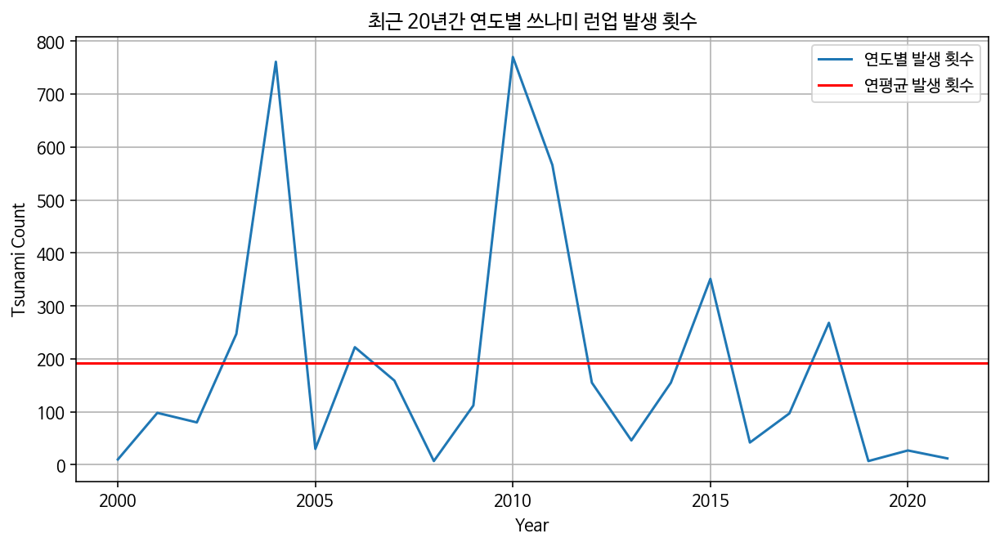

In [ ]:
plt.figure(figsize=(10,5))
sns.lineplot(x='Year', y = 'Tsunami Count', data = df_y, label='연도별 발생 횟수')
plt.axhline(y=m, c='r', label = '연평균 발생 횟수')
plt.title('최근 20년간 연도별 쓰나미 런업 발생 횟수')
plt.legend()
plt.grid();

- 최근 20년간 연도별 쓰나미 런업 횟수를 보면 2004년과 2010년에 peak를 보인다.
- 2004년 인도양 지진해일의 영향으로 남아시아의 많은 지역에서 쓰나미가 발생하였고
- 2010년은 칠레 대지진으로 태평양 연안 53개 국가에 쓰나미 경보가 발령되기도 했다.

#### Data Leakage(정보 누수)
- 정보 누수에 의해 타겟값에 영향을 줄 수 있는 특성을 미리 제외해줘야 한다.
- Measurement Type 특성은 쓰나미가 발생했을 때 어느 위치에서 어떤 방법으로 높이를 측정하는지에 대한 데이터인데,
- 타겟값인 쓰나미의 높이를 측정할 때 결정되는 특성이므로 예측시점에 알 수 없는 데이터라고 볼 수 있다.
- 따라서 Measurement Type 특성은 제외해준다.

In [ ]:
df.drop('Measurement Type', axis=1, inplace=True)

In [ ]:
df.shape

(10547, 15)

### 4) 머신러닝 방식 적용 및 교차검증

#### 데이터 나누기
- 데이터는 훈련,검증,테스트 셋으로 나누어 준다. 비율은 3:1:1이며 무작위로 나눈다. 
- 이 데이터는 시간순서에 따라 작성되어있기는 하지만, 시계열 데이터로는 볼 수 없다.(일정한 시간 간격으로 배치된 데이터들이 아니며 시간흐름에 따라 향후에 일어날 이벤트를 예측하려는 것이 아니기 때문) 
- 만약 쓰나미 데이터를 통해 향후에 언제 쓰나미가 또 일어날지를 예측한다면 시계열 분석이 필요할 것이다.

In [ ]:
target = 'Maximum Water Height (m)'

In [ ]:
from sklearn.model_selection import train_test_split
train_pre, test = train_test_split(df,
                                   test_size = 0.2,
                                   random_state=11)
print("train_pre shape: ", train_pre.shape)
print("test shape: ", test.shape)

train_pre shape:  (8437, 15)
test shape:  (2110, 15)


In [ ]:
train, val = train_test_split(train_pre, 
                              test_size = 0.25,
                              random_state=11)
print("train shape: ", train.shape)
print("val shape: ", val.shape)

train shape:  (6327, 15)
val shape:  (2110, 15)


In [ ]:
features = df.columns.drop([target])

In [ ]:
X_train = train[features]
y_train = train[target]
X_val = val[features]
y_val = val[target]
X_test = test[features]
y_test = test[target]

#### 베이스라인 모델
- 회귀에서 베이스라인 모델은 타겟의 평균값을 기준으로 한다.

In [ ]:
from sklearn.metrics import mean_absolute_error

predict = y_train.mean()

y_pred = [predict] * len(y_train)
mae = mean_absolute_error(y_train, y_pred)

print(f'훈련 에러: {mae:.5f}')

훈련 에러: 2.02857


In [ ]:
predict = y_val.mean()

y_pred_val = [predict] * len(y_val)
mae = mean_absolute_error(y_val, y_pred_val)
print(f'검증 에러: {mae:.5f}')

검증 에러: 2.07183


- 베이스라인 모델의 검증데이터 MAE는 2.07183 이다.

#### Linear Model

다중선형회귀모델 학습
- SelectKBest를 사용해서 다중선형회귀모델을 학습해보고 가장 성능이 좋은 모델의 mae 값을 구해본다.

In [ ]:
from category_encoders import OrdinalEncoder

encoder = OrdinalEncoder()
X_train_enc = encoder.fit_transform(X_train)
X_val_enc = encoder.transform(X_val)

1 features
Selected names:  Index(['Number_of_runups'], dtype='object')
Val MAE: 1.95673
Val R2: 0.07095252349779446 

2 features
Selected names:  Index(['Distance From Source (km)', 'Number_of_runups'], dtype='object')
Val MAE: 1.77866
Val R2: 0.2013522444489052 

3 features
Selected names:  Index(['Latitude', 'Distance From Source (km)', 'Number_of_runups'], dtype='object')
Val MAE: 1.74196
Val R2: 0.22203075024498875 

4 features
Selected names:  Index(['Latitude', 'Longitude', 'Distance From Source (km)',
       'Number_of_runups'],
      dtype='object')
Val MAE: 1.71978
Val R2: 0.23528666385661945 

5 features
Selected names:  Index(['Earthquake Magnitude', 'Latitude', 'Longitude',
       'Distance From Source (km)', 'Number_of_runups'],
      dtype='object')
Val MAE: 1.70652
Val R2: 0.24515310733226603 

6 features
Selected names:  Index(['Earthquake Magnitude', 'Latitude', 'Longitude',
       'Distance From Source (km)', 'Number_of_runups', 'Date'],
      dtype='object')
Val MAE

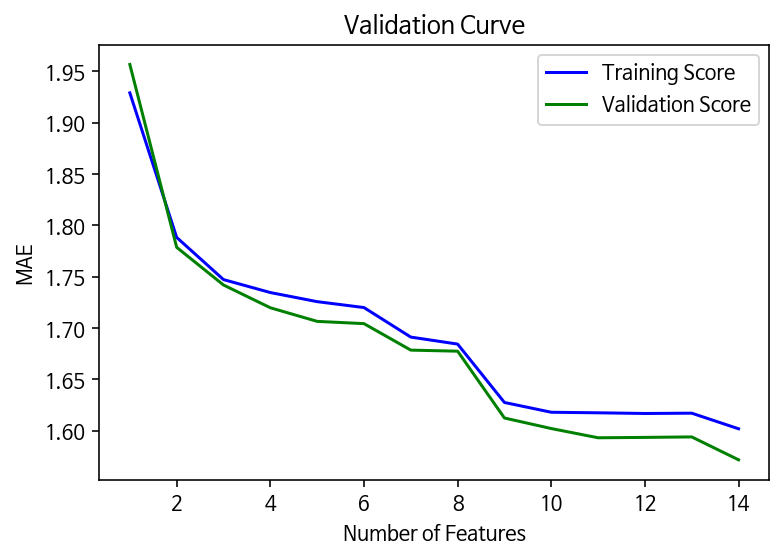

In [ ]:
from sklearn.feature_selection import f_regression, SelectKBest
from sklearn.linear_model import LinearRegression
from category_encoders import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_absolute_error, r2_score

training = []
validation = []
ks = range(1, len(X_train.columns)+1)

# 1 부터 특성 수 만큼 사용한 모델을 만들어서 MAE 값을 비교 합니다.
for k in range(1, len(X_train.columns)+ 1):
    print(f'{k} features')
    
    selector = SelectKBest(score_func=f_regression, k=k)
    
    X_train_selected = selector.fit_transform(X_train_enc, y_train)
    X_val_selected = selector.transform(X_val_enc)
    
    all_names = X_train.columns
    selected_mask = selector.get_support()
    selected_names = all_names[selected_mask]
    print('Selected names: ', selected_names)

    
    model = make_pipeline(
        StandardScaler(),
        LinearRegression()
    )
    model.fit(X_train_selected, y_train)

    y_pred = model.predict(X_train_selected)
    mae = mean_absolute_error(y_train, y_pred)
    training.append(mae)
    
    y_pred = model.predict(X_val_selected)
    mae = mean_absolute_error(y_val, y_pred)
    r2 = r2_score(y_val, y_pred)
    validation.append(mae)
    print(f'Val MAE: {mae:,.5f}')
    print(f'Val R2: {r2} \n')

plt.plot(ks, training, label='Training Score', color='b')
plt.plot(ks, validation, label='Validation Score', color='g')
plt.ylabel("MAE")
plt.xlabel("Number of Features")
plt.title('Validation Curve')
plt.legend()
plt.show()

- 다중선형회귀모델에서 특성의 수를 변경해가며 성능을 측정해보았다. 가장 많은 특성을 가질 때 MAE가 가장 적었으며,
- 다중선형회귀모델에서 검증셋 최적의 MAE: 1.57165 이다.
- 기준모델 대비 MAE가 줄어든 것을 볼 수 있다.

#### 결정트리 모델
- 결정트리모델은 트리의 깊이가 깊어질수록 과적합이 일어나 훈련세트는 정확히 맞추지만, 검증셋이나 훈련셋은 성능이 매우 떨어지는 결과를 초래할 수 있다.
- 또 너무 트리가 얕은 과소적합이 되면 충분한 학습이 불가능하여 성능이 나오지 않는다.
- 따라서 과소적합과 과적합 사이에 있는 이상적인 모델을 찾기 위해 결정트리의 하이퍼파라미터 중 max_depth를 바꿔 보며 추이를 살펴보았다.


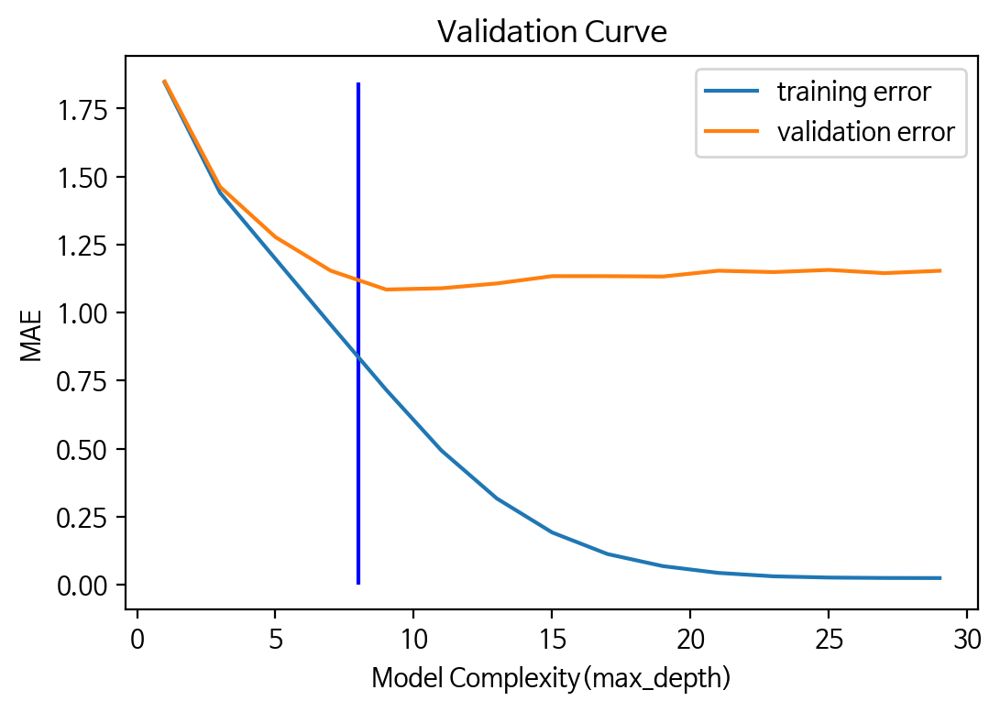

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from category_encoders import OrdinalEncoder
from sklearn.model_selection import validation_curve
from sklearn.tree import DecisionTreeRegressor

pipe = make_pipeline(
    OrdinalEncoder(),  
    DecisionTreeRegressor()
)

depth = range(1, 30, 2)
ts, vs = validation_curve(
    pipe, X_train, y_train
    , param_name='decisiontreeregressor__max_depth'
    , param_range=depth, scoring='neg_mean_absolute_error'
    , cv=3
    , n_jobs=-1
)

train_scores_mean = np.mean(-ts, axis=1)
validation_scores_mean = np.mean(-vs, axis=1)

fig, ax = plt.subplots()

# 훈련세트 검증곡선
ax.plot(depth, train_scores_mean, label='training error')

# 검증세트 검증곡선
ax.plot(depth, validation_scores_mean, label='validation error')

# 이상적인 max_depth
ax.vlines(8,0, train_scores_mean.max(), color='blue')

# 그래프 셋팅
ax.set(title='Validation Curve'
      , xlabel='Model Complexity(max_depth)', ylabel='MAE')
ax.legend()
fig.dpi = 100

In [ ]:
from sklearn.metrics import mean_absolute_error

pipe = make_pipeline(
    OrdinalEncoder(),  
    DecisionTreeRegressor(max_depth = 8, random_state=11)
)

pipe.fit(X_train, y_train)

y_pred_val = pipe.predict(X_val)
mae = mean_absolute_error(y_val, y_pred_val)
print(f'결정트리 모델의 검증세트 MAE: {mae:,.5f}')

결정트리 모델의 검증세트 MAE: 1.04208


- 결정트리모델에서 이상적인 max_depth=8 일 때 검증세트의 MAE = 1.04208
- 선형모델에 비해 많이 좋아진 모습이다.

#### 랜덤포레스트 모델
- 하이퍼파라미터 튜닝 : 위에서 구한 하이퍼파라미터 max_depth 외의 여러 하이퍼파라미터를 랜덤으로 조합하여 최적의 랜덤포레스트 모델을 만들어 보자.
- 교차검증을 할 때의 k=3으로 설정하였다.

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import randint, uniform

pipe = make_pipeline(
    OrdinalEncoder(),  
    RandomForestRegressor(random_state=11)
)

dists = {    
    'randomforestregressor__n_estimators': randint(50, 500), 
    'randomforestregressor__max_depth': [5, 6, 7, 8], 
    'randomforestregressor__max_features': uniform(0, 1) # max_features
}

clf = RandomizedSearchCV(
    pipe, 
    param_distributions=dists, 
    n_iter=50, 
    cv=3, 
    scoring='neg_mean_absolute_error',  
    verbose=1,
    n_jobs=-1
)

clf.fit(X_train, y_train);

Fitting 3 folds for each of 50 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:  3.7min finished


In [ ]:
print('최적 하이퍼파라미터: ', clf.best_params_)
print('MAE: ', -clf.best_score_)

최적 하이퍼파라미터:  {'randomforestregressor__max_depth': 8, 'randomforestregressor__max_features': 0.862902528318136, 'randomforestregressor__n_estimators': 91}
MAE:  1.0446591862650783


In [ ]:
pd.DataFrame(clf.cv_results_).sort_values(by='rank_test_score').T

,19,34,23,6,49,33,46,27,3,10,29,1,14,2,41,32,35,40,9,15,0,30,39,31,42,47,25,43,17,16,38,44,20,4,24,22,28,37,26,11,8,12,36,7,45,5,18,48,21,13
mean_fit_time,1.8424,2.12405,7.94951,8.74026,4.65684,3.65062,5.06124,4.30464,5.67441,3.04637,1.69306,2.55405,0.967458,2.96632,2.3382,4.58606,2.10726,5.66743,4.17387,0.441377,2.13847,2.80944,5.75058,3.13675,3.16265,1.55776,0.697292,2.09042,1.45805,3.56962,3.39645,2.80562,1.81107,0.714398,7.25402,2.96699,3.63248,2.00655,2.49405,2.11701,1.78854,1.4465,0.578073,1.82863,1.72574,1.24646,1.53287,1.96134,1.06599,0.438469
std_fit_time,0.0233549,0.0179018,0.0305319,0.0224414,0.440461,0.0073919,0.0189569,0.0264293,0.00468482,0.0291571,0.0471328,0.0191019,0.0112264,0.00427117,0.02228,0.0170445,0.0412551,0.0133535,0.0208969,0.019597,0.0239773,0.0183383,0.00710686,0.0778283,0.00866095,0.0216195,0.00786243,0.0303262,0.0195234,0.017624,0.0131772,0.0169565,0.0119035,0.00558962,0.00671273,0.0433519,0.0338836,0.00665876,0.0185942,0.0166557,0.0171388,0.0209495,0.0112861,0.0208201,0.0548097,0.0659671,0.017931,0.0361221,0.0129222,0.00869234
mean_score_time,0.0423002,0.0451979,0.127374,0.155397,0.084272,0.0700909,0.106161,0.0911148,0.123268,0.0716001,0.0583467,0.0864302,0.0412871,0.124032,0.0940705,0.0839208,0.052422,0.140189,0.109391,0.0299339,0.0777083,0.16296,0.119862,0.0703607,0.147006,0.0776966,0.0287344,0.0579638,0.0559866,0.145559,0.132755,0.158429,0.10479,0.0484601,0.132427,0.0775358,0.0944785,0.067409,0.0788002,0.0722643,0.128375,0.115056,0.0283279,0.111313,0.120024,0.130701,0.0909367,0.13956,0.0774276,0.0384529
std_score_time,0.00311809,0.00217363,0.00204722,0.00371215,0.0123002,0.00681713,0.00229893,0.00289445,0.00183882,0.00152364,0.00247056,0.00996926,0.0018195,0.00778234,0.00199996,0.0011405,0.00114987,0.00739697,0.00905843,0.00154473,0.00539547,0.0055728,0.0113423,0.00037472,0.00764571,0.00397533,0.00133833,0.00129631,0.000382133,0.00590537,0.000548641,0.0592461,0.00224322,0.00176518,0.00609808,0.00690169,0.00163442,0.000999227,0.000894844,0.000784059,0.00277198,0.00741764,0.000224594,0.0043883,0.000331297,0.0589981,0.00346872,0.0088372,0.00108907,0.000196544
param_randomforestregressor__max_depth,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,7,7,7,7,8,7,8,6,6,7,7,6,6,6,6,6,6,7,7,5,5,5,5,5,5,8,8,5,6,7,7,5,6,6,5
param_randomforestregressor__max_features,0.862903,0.913025,0.990055,0.909233,0.920285,0.954822,0.754979,0.726096,0.691395,0.674777,0.483939,0.481309,0.380197,0.325091,0.310915,0.92026,0.703327,0.634702,0.583676,0.227994,0.379307,0.184346,0.794843,0.729332,0.244455,0.284149,0.539899,0.597047,0.40103,0.34213,0.308331,0.315101,0.169135,0.213276,0.99335,0.648251,0.617915,0.485095,0.476633,0.442149,0.0929859,0.024129,0.397382,0.154993,0.00171518,0.115065,0.180967,0.0160966,0.0870921,0.114331
param_randomforestregressor__n_estimators,91,105,376,442,247,173,296,252,355,189,140,212,90,322,259,256,143,434,317,53,219,465,386,219,456,217,62,177,171,479,456,375,317,122,483,260,347,231,288,248,385,308,71,354,383,263,327,473,260,111
params,"{'randomforestregressor__max_depth': 8, 'rando...","{'randomforestregressor__max_depth': 8, 'rando...","{'randomforestregressor__max_depth': 8, 'rando...","{'randomforestregressor__max_depth': 8, 'rando...","{'randomforestregressor__max_depth': 8, 'rando...","{'randomforestregressor__max_depth': 8, 'rando...","{'randomforestregressor__max_depth': 8, 'rando...","{'randomforestregressor__max_depth': 8, 'rando...","{'randomforestregressor__max_depth': 8, 'rando...","{'randomforestregressor__max_depth': 8, 'rando...","{'randomforestregressor__max_depth': 8, 'rando...","{'randomforestregressor__max_depth': 8, 'rando...","{'randomforestregressor__max_depth': 8, 'rando...","{'randomforestregressor__max_depth': 8, 'rando...","{'randomforestregressor__max_depth': 8, 'rando...","{'randomforestregressor__max_depth': 7, 'rando...","{'randomforestregressor__max_depth': 7, 'rando...","{'randomforestregressor__max_depth': 7, 'rando...","{'randomforestregressor__max_depth': 7, 'rando...","{'random

In [ ]:
# 만들어진 모델에서 가장 성능이 좋은 모델을 불러오기
pipe = clf.best_estimator_

In [ ]:
from sklearn.metrics import mean_absolute_error

y_pred = pipe.predict(X_val)
mae = mean_absolute_error(y_val, y_pred)
print(f'랜덤포레스트모델의 검증세트 MAE: {mae:,.5f}')

랜덤포레스트모델의 검증세트 MAE: 0.93918


- 랜덤포레스트 모델에서 최적의 하이퍼파라미터 일 때 검증세트의 MAE = 0.93918
- 결정트리모델보다 더 좋은 성능을 보인다.

#### 그래디언트 부스팅 모델
- 트리기반의 앙상블 모델 중 그래디언트 부스팅 모델을 사용해본다.
- 위의 결정트리모델과 랜덤포레스트 모델에서 모두 max_depth=8 일 때 가장 좋은 성능을 보였으므로 이 하이퍼파라미터를 동일하게 주고, 
- 과적합을 막기 위한 방법으로 estimator의 수를 바꿔가며 early stopping을 이용해서 최적의 그래디언트 부스팅 모델을 찾아본다.

In [ ]:
from sklearn.metrics import r2_score
from xgboost import XGBRegressor

encoder = OrdinalEncoder()
X_train_encoded = encoder.fit_transform(X_train) # 학습데이터
X_val_encoded = encoder.transform(X_val) # 검증데이터

boosting = XGBRegressor(
    random_state=11,
    max_depth=8,
    n_estimators=1000,
    objective='reg:squarederror', # default
    learning_rate=0.2,
    n_jobs=-1
)

eval_set = [(X_train_encoded, y_train), 
            (X_val_encoded, y_val)]

boosting.fit(X_train_encoded, y_train, 
          eval_set=eval_set,
          eval_metric='mae',
          early_stopping_rounds=50
         )

[0]	validation_0-mae:1.66266	validation_1-mae:1.67408
Multiple eval metrics have been passed: 'validation_1-mae' will be used for early stopping.

Will train until validation_1-mae hasn't improved in 50 rounds.
[1]	validation_0-mae:1.41016	validation_1-mae:1.44668
[2]	validation_0-mae:1.21919	validation_1-mae:1.27338
[3]	validation_0-mae:1.07608	validation_1-mae:1.15047
[4]	validation_0-mae:0.970954	validation_1-mae:1.06153
[5]	validation_0-mae:0.896101	validation_1-mae:1.00282
[6]	validation_0-mae:0.83905	validation_1-mae:0.965447
[7]	validation_0-mae:0.798305	validation_1-mae:0.944211
[8]	validation_0-mae:0.763479	validation_1-mae:0.927362
[9]	validation_0-mae:0.736205	validation_1-mae:0.917893
[10]	validation_0-mae:0.71752	validation_1-mae:0.915453
[11]	validation_0-mae:0.705898	validation_1-mae:0.922777
[12]	validation_0-mae:0.685306	validation_1-mae:0.917597
[13]	validation_0-mae:0.672552	validation_1-mae:0.917481
[14]	validation_0-mae:0.662016	validation_1-mae:0.926347
[15]	valid

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.2, max_delta_step=0,
             max_depth=8, min_child_weight=1, missing=None, n_estimators=1000,
             n_jobs=-1, nthread=None, objective='reg:squarederror',
             random_state=11, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
             seed=None, silent=None, subsample=1, verbosity=1)

In [ ]:
y_pred = boosting.predict(X_val_encoded)
print('R^2', r2_score(y_val, y_pred))
print('MAE', mean_absolute_error(y_val, y_pred))

R^2 0.6769718833764269
MAE 0.9154528237982384


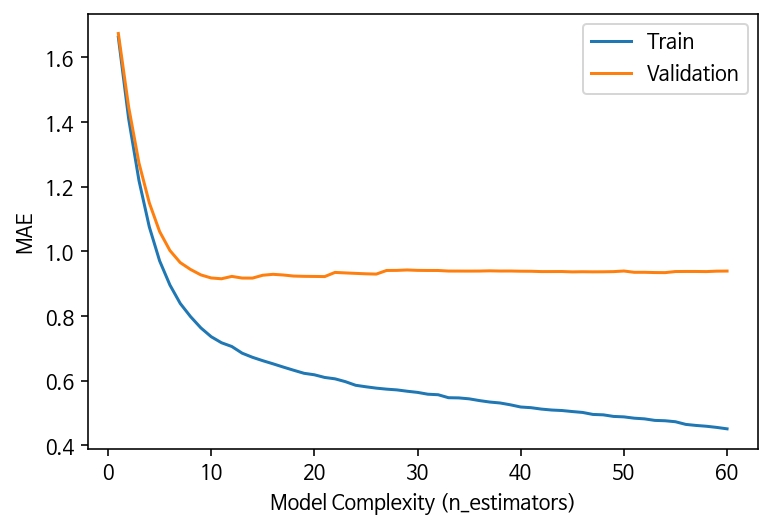

In [ ]:
results = boosting.evals_result()
train_error = results['validation_0']['mae']
val_error = results['validation_1']['mae']

epoch = range(1, len(train_error)+1)
plt.plot(epoch, train_error, label='Train')
plt.plot(epoch, val_error, label='Validation')
plt.ylabel('MAE')
plt.xlabel('Model Complexity (n_estimators)')
# plt.ylim((0.15, 0.25)) # Zoom in
plt.legend();

- 그래디언트 부스팅 모델에서 Early stopping을 적용한 최적모델의 검증세트 MAE = 0.91545
- 가장 좋은 성능을 보인다.

#### 모델 비교
- 위의 네가지 모델에 대해 검증세트의 성능을 요약정리하고 가장 좋은 모델을 선정한다.
- 최종 모델의 test 점수를 알아본다.

검증셋에 대한 평가지표 MAE 기준,

(0) 베이스라인 모델 : 2.07183

(1) 다중선형회귀 모델 : 1.57165

(2) 결정트리 모델 : 1.04208

(3) 랜덤포레스트 모델 : 0.93918

(4) 그래디언트 부스팅 모델 : 0.91545

- 따라서, 검증셋의 MAE가 가장 낮은 그래디언트 부스팅 모델을 최종 모델로 선정한다.

#### 최종 모델 설명
그래디언트 부스팅 모델
- 그래디언트 부스팅 모델은 트리앙상블 모델 중 하나로 특성간 상호작용이 존재하는 데이터 학습에 적용하기 좋으며
- Boosting 앙상블을 통해 과적합을 피할 수 있다.
- 하이퍼파라미터의 영향에 민감한 편이라, 좋은 하이퍼파라미터를 선정할 시 예측 성능이 뛰어나다.
- 최종 모델의 주요 하이퍼파라미터는 아래와 같다.
  - max_depth=8
  - n_estimators=10
  - learning_rate=0.2
- 여기서, max_depth는 트리의 깊이로 결정트리와 랜덤포레스트 방식에서 최적의 max_depth가 모두 8로 도출되었기에 같은 값을 적용하였다.
- estimator의 수는 early stopping 방식을 사용하였다. 이 방법은 estimator의 수를 늘려가며 성능을 계산했을 때, 50회동안 변화가 없으면 멈추도록 하여 짧은 시간 내에 효과적으로 학습하도록 했다.

In [ ]:
X_test_encoded = encoder.transform(X_test)
y_pred = boosting.predict(X_test_encoded)
print('R^2', r2_score(y_test, y_pred),'\n')
print('최종모델(그래디언트 부스팅 모델)의 테스트세트 MAE', mean_absolute_error(y_test, y_pred))

R^2 0.6526380361891271 

최종모델(그래디언트 부스팅 모델)의 테스트세트 MAE 0.9991815230925503


- 최종모델(그래디언트 부스팅 모델)의 테스트세트 MAE 0.99918 이다.

### 5) 머신러닝 모델 해석
- 최종모델을 PDP, SHAP 등을 활용해 어떤 특성이 타겟에 영향을 끼쳤는지 해석해 본다.

#### PDP를 통한 결과 해석

PDP(1 특성 사용)

  - 지진 규모에 따른 결과 해석

In [ ]:
from pdpbox.pdp import pdp_isolate, pdp_plot

feature = 'Earthquake Magnitude'

In [ ]:
isolated = pdp_isolate(
    model=boosting, 
    dataset=X_val_encoded, 
    model_features=X_val_encoded.columns, 
    feature=feature,
    num_grid_points=100
)

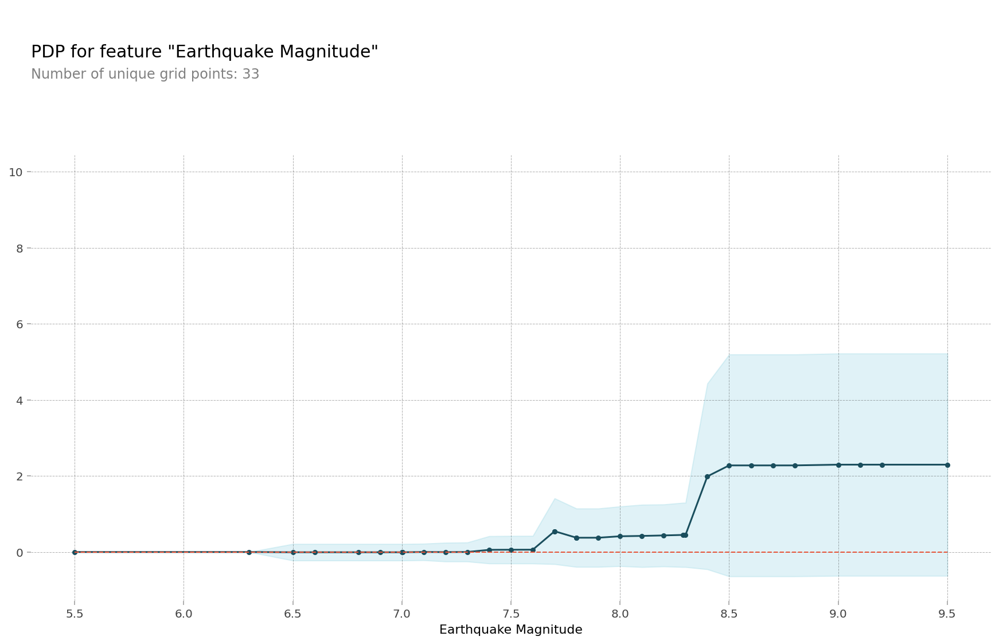

In [ ]:
pdp_plot(isolated, feature_name=feature);

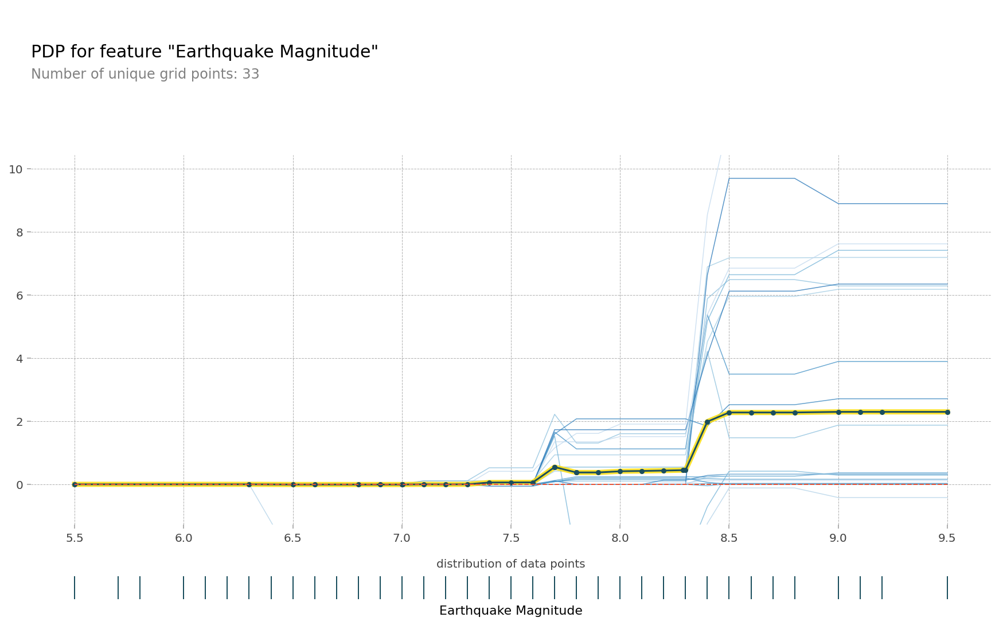

In [ ]:
pdp_plot(isolated
         , feature_name=feature
         , plot_lines=True
         , frac_to_plot=0.01
         , plot_pts_dist=True );

- 지진의 규모가 커짐에 따라 타겟값인 쓰나미 수위가 높아지는 것을 볼 수 있다.
- 특히 규모 8.0~8.5 사이에서 큰 폭의 변화가 있음을 알 수 있는데, 각각의 ICE curve로 보면 매우 큰 상승 폭을 가지는 경우도 있는 반면 변화가 미미한 경우도 있다.
- 따라서 다른 특성에 의한 영향도 함께 고려해줘야 할 것이다.

- 런업 횟수에 따른 결과 해석

In [ ]:
from pdpbox.pdp import pdp_isolate, pdp_plot

feature = 'Number_of_runups'

In [ ]:
isolated = pdp_isolate(
    model=boosting, 
    dataset=X_val_encoded, 
    model_features=X_val_encoded.columns, 
    feature=feature,
    num_grid_points=100
)

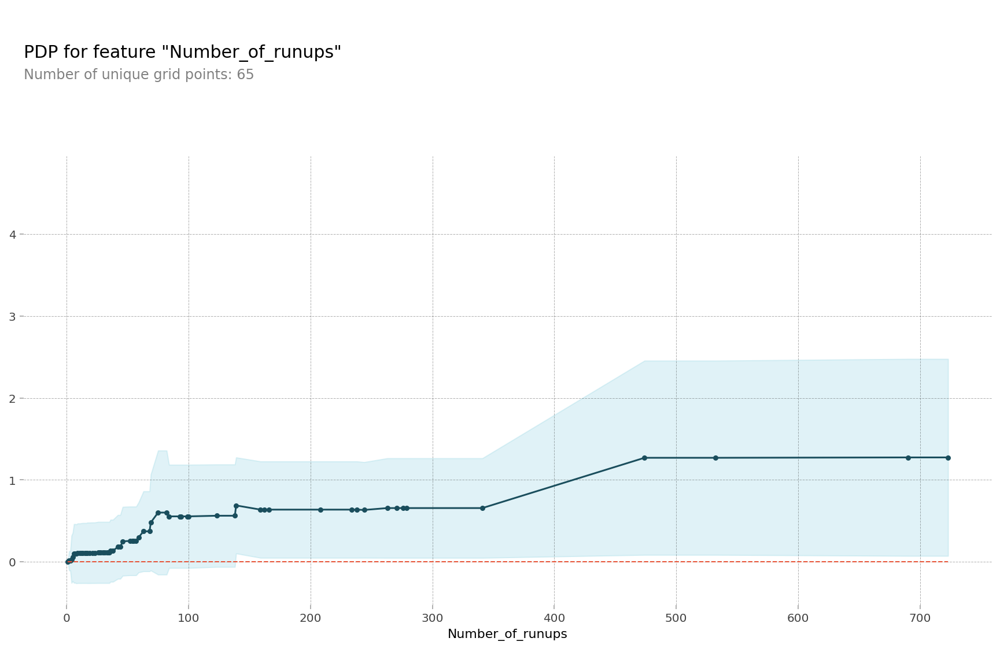

In [ ]:
pdp_plot(isolated, feature_name=feature);

- 쓰나미 이벤트당 런업 횟수에 대해 PDP를 확인해 보면, 런업 횟수가 증가할수록 타겟값인 쓰나미 수위가 높아지는 경향이 있음을 볼 수 있다.

PDP(2 특성 사용)

- 지진규모와 진원지까지의 거리 특성을 통한 결과 해석
  - 앞의 PDP(1특성 사용)에서 지진규모를 통한 결과 해석을 해보았는데, 이번에는 쓰나미 런업 장소와 쓰나미(진원지)의 거리 특성을 동시에 활용하여 결과를 해석해본다.

In [ ]:
from pdpbox.pdp import pdp_interact, pdp_interact_plot

In [ ]:
features = ['Earthquake Magnitude', 'Distance From Source (km)']

interaction = pdp_interact(
    model=boosting, 
    dataset=X_val_encoded,
    model_features=X_val.columns, 
    features=features
)

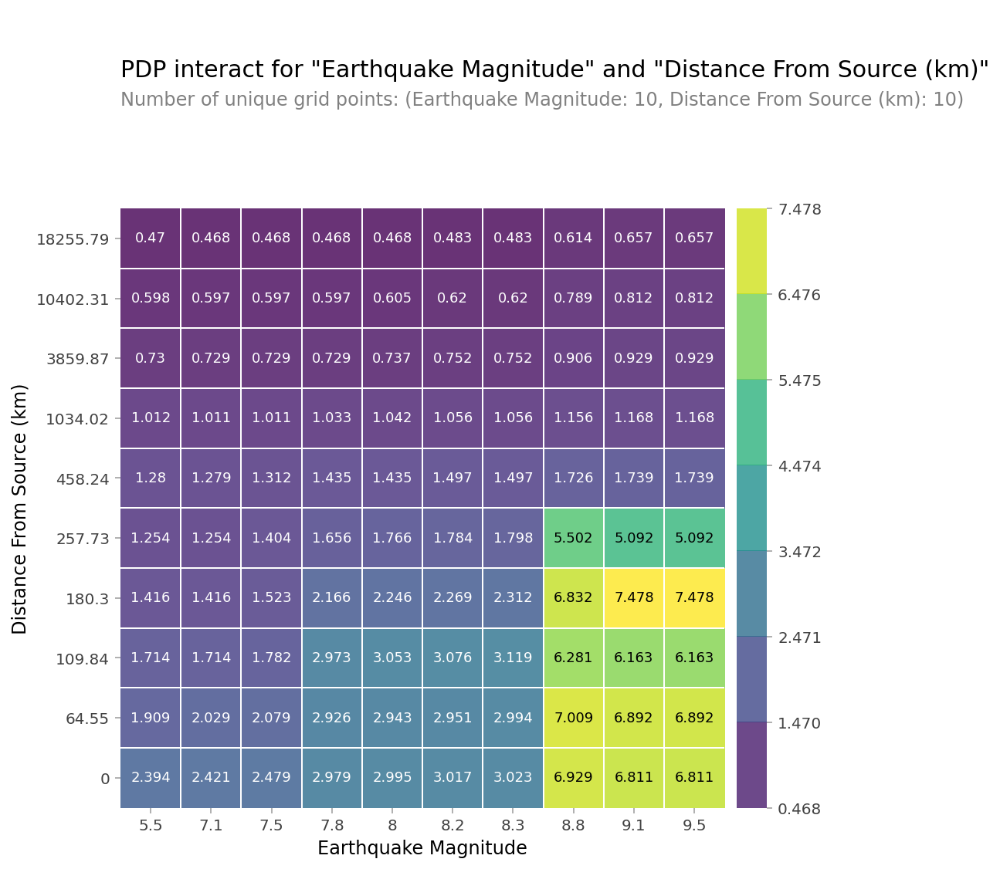

In [ ]:
pdp_interact_plot(interaction, plot_type='grid', 
                  feature_names=features);

- XGBoost로 만든 모델에서 'Earthquake Magnitude' 특성과 'Distance From Source (km)' 두가지 특성의 상호작용을 살펴보았다.
- 쓰나미 발생 장소(진원지)와의 거리가 가깝고 지진규모가 클수록 쓰나미의 높이가 더 높아지는 경향을 볼 수 있으며,
- 지진 규모가 8.8 이상인 경우 0~260km의 거리에서 5m 이상의 높은 쓰나미가 발생한다.

#### SHAP

테스트셋에서 하나의 샘플을 뽑아 각 특성이 예측에 주는 영향 살펴보기

In [ ]:
row = X_test.iloc[[1111]]  # 임의로 하나의 샘플을 선택함
row

,Year,Mo,Dy,Tsunami Event Validity,Tsunami Cause Code,Earthquake Magnitude,Country,Location Name,Latitude,Longitude,Distance From Source (km),Tsu_eventNo,Number_of_runups,Date
336,1868,8,13,4,1,8.5,AUSTRALIA,PORT FAIRY,-38.383,142.244,12810.735,983,41,1868-8-13


In [ ]:
import xgboost
import shap

explainer = shap.TreeExplainer(boosting)
row_encoded = encoder.transform(row)
shap_values = explainer.shap_values(row_encoded)

shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value, 
    shap_values=shap_values, 
    features=row
)

- 테스트셋 중 하나의 샘플을 뽑아 살펴보았다.
- Base value는 타겟의 평균값으로 계산되며, 각 특성이 Base value로부터 이 샘플의 예측값을 어떻게 변화시켰는지를 확인할 수 있다.
- 예측값을 높인데 가장 큰 영향을 준 것은 지진규모이다. 이 쓰나미의 원인이 된 지진은 규모 8.5로 매우 큰 규모이다.
- Tsu_eventNo는 이 샘플의 쓰나미 이벤트 번호인데, 해당 쓰나미로 인해 발생한 여러 런업들의 수위가 높았기 때문에 이 샘플에서도 예측값을 높이는 방향으로 작용한 것 같다.
- 반면, 예측값을 낮추도록 한 특성은 진원지와의 거리였다. 무려 만킬로미터 이상 떨어져있어서, 지진 규모가 매우 큼에도 런업의 높이가 낮게 예측되었다.

- 이 샘플의 Base value : 2.083 (m)
- 모델을 통해 예측한 값 : 1.80 (m)

여러가지 샘플에 대해 특성별 영향을 시각화하기

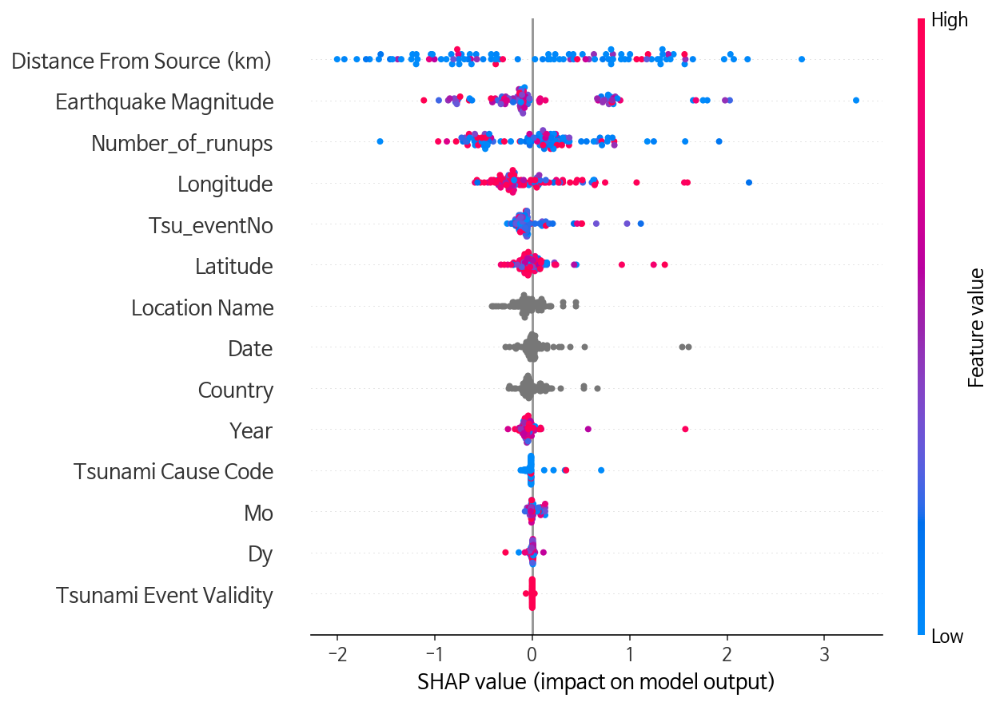

In [ ]:
shap_values = explainer.shap_values(X_test_encoded.iloc[:100])
shap.summary_plot(shap_values, X_train.iloc[:100])

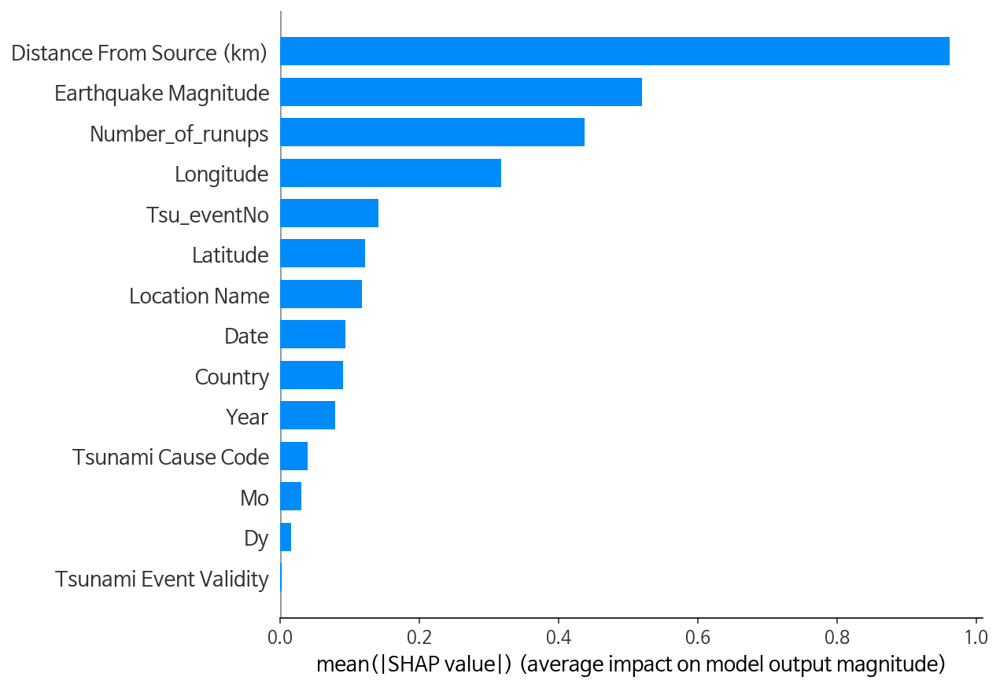

In [ ]:
shap.summary_plot(shap_values, X_train.iloc[:100], plot_type="bar")

- 여러 개(100개)의 샘플에 미치는 영향을 살펴보면, 
- 쓰나미 발생 장소(진원지)와의 거리 특성이 가장 분산이 크고 양, 음 방향으로 모두 큰 영향을 주고 있다.
- 지진 규모가 두번째로 분산이 크며 다음으로는 쓰나미 이벤트당 발생한 런업의 수가 영향력 있는 특성으로 나타났다.
- 위경도 특성도 중상위에 위치한 것을 볼 수 있는데, 지리적인 위치에 의해 쓰나미 파도 높이가 달라질 수 있음을 알 수 있다. 
- 예를 들면 우리나라의 경우 환태평양 조산대에서 발생하는 지진 및 쓰나미가 잦음에도 쓰나미 피해가 거의 없는데, 이 이유를 주변국(일본 등)의 위치정보를 통해 이해할 수 있다.

#### 추가하고 싶은 특성
- 위에서 언급한대로, **지리적인 여건**으로 인해 쓰나미가 자주 발생하지 않거나 파도가 높고 낮은 차이를 보이게 될 수 있다.
- 위경도 특성에 있어서 지리적으로 영향을 더 받거나 덜 받을 수 있는 요인이 있을지를 특성으로 추가한다면 좀 더 성능이 좋은 모델을 만들 수 있을 것이라 생각한다.
- 다만 이런 특성을 추가하기 위해서는 **지도 및 지형적인 특징**을 감안해야 하는데 이번 과제에서 같이 다루기에는 어려움이 있었던 것 같다.

#### 현실, 희망
- **우리나라의 경우** 2004년 인도양 지진해일 이후로, 지진해일 예보 시스템을 만들어 운영하고 있는데, 인근 해역을 **격자**로 나눈 뒤 **슈퍼컴퓨터를 이용하여 시뮬레이션** 하였다고 한다.
- **경제적으로 어려운 국가들**에서 이런 첨단 프로그램을 갖출 수는 없겠지만, **머신러닝을 이용한 간단한 데이터분석**만으로도 피해를 줄일 수 있지 않을까 하는 바람으로 프로젝트를 진행해보았다.